# Часть 1. АИС Реестр зелёных насаждений г. Москвы

## Часть 1.2 исследуем самые распространённые деревья в Москве

In [2]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
# библиотека для визуализации
# %matplotlib widget
import matplotlib.pyplot as plt
from libpysal.weights import Queen
from esda.moran import Moran
import plotly.express as px
import plotly.graph_objects as go

In [2]:
# Загрузка shapefile с точками
# тут всегда вылетает кернел
points = gpd.read_file('dpioos_green_stands_utm37n/dpioos_green_stands_utm37n.shp')

In [7]:
points['class'].unique()

array(['Tree', 'Bush', 'Liana'], dtype=object)

In [3]:
points_trees = points[points['class']=='Tree']
points_trees['class'].unique()

array(['Tree'], dtype=object)

In [11]:
# create a dictionary of unique species_ru values and their counts
species_dict = dict(points_trees['species_ru'].value_counts())

# convert the dictionary to a pandas DataFrame
species_df = pd.DataFrame(list(species_dict.items()), columns=['Species', 'Count'])

# write the DataFrame to an Excel file
species_df.to_excel('species.xlsx', index=False)

In [9]:
species = pd.read_excel('species.xlsx')
species.Species.unique()

array(['Клен ясенелистный', 'Клен остролистный', 'Липа мелколистная',
       'Береза повислая (бородавчатая, обыкновенная)',
       'Тополь бальзамический', 'Ясень обыкновенный',
       'Рябина обыкновенная', 'Вишня обыкновенная',
       'Ясень пенсильванский', 'Яблоня домашняя',
       'Каштан конский обыкновенный', 'Липа европейская (обыкновенная)',
       'Ива ломкая', 'Тополь дрожащий (осина)', 'Ива белая',
       'Черемуха обыкновенная', 'Липа крупнолистная (широколистная)',
       'Слива домашняя', 'Ель обыкновенная (европейская)',
       'Дуб черешчатый', 'Туя западная', 'Сосна обыкновенная',
       'Береза пушистая', 'Ива козья', 'Вяз гладкий',
       'Боярышник вееролистный (колючий, обыкновенный, сглаженный)',
       'Вяз шершавый', 'Вяз мелколистный', 'Лиственница европейская',
       'Яблоня обыкновенная', 'Груша обыкновенная', 'Клен татарский',
       'Лиственница сибирская', 'Ель колючая', 'Слива обыкновенная',
       'Вяз обыкновенный', 'Клен приречный (гиннала)',
      

Удаляем выбросы по высоте

In [4]:
points_trees = gpd.read_file('points_trees.shp')

In [4]:
points_trees

,objectid,species_ru,species_l,height_m,d_trunk_m,d_canopy_m,class,source,adm_region,geometry
0,2920027,Клен татарский,None,1.3,0.02,None,Tree,DPIOOS Moscow,район Савёлки,POINT (389917.199 6207402.099)
1,2920707,Вишня обыкновенная,None,2.0,0.02,None,Tree,DPIOOS Moscow,Можайский район,POINT (399607.241 6175167.105)
2,2920695,Ель обыкновенная (европейская),None,2.0,0.06,None,Tree,DPIOOS Moscow,Можайский район,POINT (399683.528 6175531.449)
3,2920301,Каштан конский обыкновенный,None,2.0,0.04,None,Tree,DPIOOS Moscow,район Щукино,POINT (405022.406 6184562.092)
4,2920838,Тополь бальзамический,None,2.0,0.06,None,Tree,DPIOOS Moscow,район Нагатино-Садовники,POINT (413473.774 6169387.397)
...,...,...,...,...,...,...,...,...,...,...
5100655,1759888,Клен ясенелистный,None,10.0,0.20,None,Tree,DPIOOS Moscow,район Кузьминки,POINT (410654.536 6195424.224)
5100656,2007541,Черемуха обыкновенная,None,5.0,0.06,None,Tree,DPIOOS Moscow,район Кузьминки,POINT (410651.903 6195424.541)
5100657,2007542,Клен остролистный,None,7.0,0.10,None,Tree,DPIOOS Moscow,район Кузьминки,POINT (402639.190 6166723.136)
5100658,2080143,Клен остролистный,None,14.0,0.10,None,Tree,DPIOOS Moscow,район Кузьминки,POINT (399036.663 6178837.848)


In [5]:
# Calculate the mean and standard deviation of the height_m column
mean = points_trees['height_m'].mean()
std = points_trees['height_m'].std()

# Identify outliers
outliers = (points_trees['height_m'] - mean).abs() > 3*std

# Calculate median
median = points_trees['height_m'].median()

# Replace outliers with median
points_trees.loc[outliers, 'height_m'] = median

Удаляем выбросы по диаметру

In [6]:
# Calculate the mean and standard deviation of the height_m column
mean = points_trees['d_trunk_m'].mean()
std = points_trees['d_trunk_m'].std()

# Identify outliers
outliers = (points_trees['d_trunk_m'] - mean).abs() > 3*std

# Calculate median
median = points_trees['d_trunk_m'].median()

# Replace outliers with median
points_trees.loc[outliers, 'd_trunk_m'] = median

In [19]:
# Get the top 10 species
top_species = points_trees['species_ru'].value_counts().index[:11]

# For each species, calculate and print the mean height
for species in top_species:
    mean_height = points_trees[points_trees['species_ru'] == species]['height_m'].mean()
    print(f"The mean height for {species} is {mean_height} meters.")

The mean height for Клен ясенелистный is 9.53514632358299 meters.
The mean height for Клен остролистный is 11.000999524102763 meters.
The mean height for Липа мелколистная is 12.995186573345224 meters.
The mean height for Береза повислая (бородавчатая, обыкновенная) is 14.79251366685378 meters.
The mean height for Тополь бальзамический is 14.541806220549688 meters.
The mean height for Ясень обыкновенный is 8.221871475404235 meters.
The mean height for Рябина обыкновенная is 6.90530774066971 meters.
The mean height for Вишня обыкновенная is 4.309683072440524 meters.
The mean height for Ясень пенсильванский is 8.304501573295932 meters.
The mean height for Яблоня домашняя is 6.259575336187471 meters.
The mean height for Каштан конский обыкновенный is 8.042198142024079 meters.


In [7]:
species_mapping = {
    "Клен ясенелистный": "Acer negundo",
    "Клен остролистный": "Acer platanoides",
    "Липа мелколистная": "Tilia cordata",
    "Береза повислая (бородавчатая, обыкновенная)": "Betula pendula",
    "Тополь бальзамический": "Populus balsamifera",
    "Ясень обыкновенный": "Fraxinus excelsior",
    "Рябина обыкновенная": "Sorbus aucuparia",
    "Вишня обыкновенная": "Prunus cerasus",
    "Ясень пенсильванский": "Fraxinus pennsylvanica",
    "Яблоня домашняя": "Malus domestica",
    "Каштан конский обыкновенный": "Aesculus hippocastanum"
}

# Apply the mapping to the 'species_l' column
points_trees['species_l'] = points_trees['species_ru'].map(species_mapping)

/home/babykelp/anaconda3/lib/python3.9/site-packages/geopandas/geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [6]:
# List of columns to drop
columns_to_drop = ["d_canopy_m", "class", "source", "adm_region"]

# Drop the columns
points_trees = points_trees.drop(columns=columns_to_drop)

In [7]:
points_trees.to_file('points_trees_clean.shp')

Делаем топ 12 самых распространённых деревьев в Москве  
Почему 12? Потому что логично было бы 10, но нужно оценивать их высоту.   
Так как ТТ висят на 3,5 метрах над землёй, нужно чтобы медианная высота дерева была хотя бы 5 м  
Поэтому Вишня и Сирень нам не подходят

In [17]:
species = pd.read_excel('species.xlsx')

# get the top 11 species by count
top_10 = species[:10]

# create a DataFrame of the top 11 species and their counts
df = pd.DataFrame({
    'Species': top_10.Species,
    'Count': top_10.Count
})

# Map Russian names to Latin names
df['Species'] = df['Species'].map(species_mapping)

# # Truncate species names to the first two words
# df['Species'] = [' '.join(name.split()[:2]) for name in df['Species']]

# Define custom colors for the bars
# custom_colors = ['#636EFA'] + ['#FFB347'] * 3 + ['#636EFA'] * (len(df) - 4)

# create a bar chart using Plotly
fig = px.bar(df, x='Species', y='Count', labels={'Species': 'Species', 'Count': 'Count'},
             title='Top 10 Tree Species')
# fig.update_traces(marker=dict(color=custom_colors))
fig.update_layout(height=800,
                  width=800,
                  font=dict(
                      size=18,
                      family="Times New Roman"
                  ),
                  title=dict(
                      text='Top 10 Tree Species',
                      font=dict(
                          size=24,
                          family="Times New Roman"
                      ),
                  ),
                  xaxis=dict(
                      title=dict(
                          text='Species',
                          font=dict(
                              size=20,
                              family="Times New Roman"
                          ),
                      ),
                  ),
                  yaxis=dict(
                      title=dict(
                          text='Count',
                          font=dict(
                              size=20,
                              family="Times New Roman"
                          ),
                      ),
                  ),
                  )

fig.show()

Отфильтруем большой шейп и присвоим латинские названия

In [4]:
# Список видов
species_ais = ['Клен ясенелистный',
           'Клен остролистный',
           'Липа мелколистная',
           'Береза повислая (бородавчатая, обыкновенная)',
           'Тополь бальзамический',
           'Ясень обыкновенный',
           'Рябина обыкновенная',
           'Ясень пенсильванский',
           'Яблоня домашняя',
           'Каштан конский обыкновенный'
]
# Фильтрация точек по наличию видов из списка
points_filtered_ais = points[points['species_ru'].isin(species_ais)]

# Присвоение латинских названий видов в столбец species_l
for i, row in points_filtered_ais.iterrows():
    species_ru = row['species_ru']
    species_l = {
        'Клен ясенелистный': 'Acer negundo',
        'Клен остролистный': 'Acer platanoides',
        'Липа мелколистная': 'Tilia cordata',
        'Береза повислая (бородавчатая, обыкновенная)': 'Betula pendula',
        'Тополь бальзамический': 'Populus balsamifera',
        'Ясень обыкновенный': 'Fraxinus excelsior',
        'Рябина обыкновенная': 'Sorbus aucuparia',
        'Ясень пенсильванский': 'Fraxinus pennsylvanica',
        'Яблоня домашняя': 'Malus domestica',
        'Каштан конский обыкновенный': 'Aesculus hippocastanum'
    }.get(species_ru)
    points_filtered_ais.at[i, 'species_l'] = species_l

# Сохранение отфильтрованных точек в новый shapefile
# points_filtered_ais.to_file('points_filtered_ais.shp', index = True)

In [3]:
points_filtered_ais = gpd.read_file('points_filtered_ais.shp')

In [7]:
# Calculate the median height for each species
median_heights = points_filtered_ais.groupby('species_l')['height_m'].median()

# Convert the result to a pandas DataFrame
result = pd.DataFrame({'species_l': median_heights.index, 'median_height': median_heights.values})

# Print the result
print(result)

                species_l  median_height
0            Acer negundo            9.0
1        Acer platanoides           11.0
2  Aesculus hippocastanum            7.0
3          Betula pendula           15.0
4      Fraxinus excelsior            8.0
5  Fraxinus pennsylvanica            8.0
6         Malus domestica            6.0
7     Populus balsamifera           15.0
8        Sorbus aucuparia            6.0
9           Tilia cordata           13.0


In [8]:
# Define the desired order of species
species_order = ['Acer negundo', 'Acer platanoides', 'Tilia cordata', 'Betula pendula', 'Populus balsamifera', 'Fraxinus excelsior', 'Sorbus aucuparia', 'Prunus cerasus', 'Fraxinus pennsylvanica', 'Malus domestica']

# Add a column for the order
result['order'] = result['species_l'].apply(lambda x: species_order.index(x) if x in species_order else len(species_order))

# Sort the DataFrame by the order column
result = result.sort_values(by='order')

# Create a bar chart using Plotly
fig = px.bar(result, x='species_l', y='median_height', labels={'species_l': 'Species', 'median_height': 'Median Height'},
             title='Median Height of Tree Species')

# Truncate the species names on the x-axis if they are longer than two words
fig.update_xaxes(tickvals=result['species_l'], ticktext=[' '.join(name.split()[:2]) for name in result['species_l']])

# Set the layout properties
fig.update_layout(
    height=800,
    width=800,
    title={'text': 'Median Height of Tree Species', 'font': {'size': 24}},
    xaxis={'title': 'Species', 'title_font': {'size': 18}, 'tickfont': {'size': 16}},
    yaxis={'title': 'Median Height', 'title_font': {'size': 18}, 'tickfont': {'size': 16}},
)

# Show the plot
fig.show()

In [2]:
points_trees_clean = gpd.read_file('points_trees_clean.shp')

In [6]:
points_trees_clean

,objectid,species_ru,species_l,height_m,d_trunk_m,geometry
0,2920027,???? ?????????,None,1.3,0.02,POINT (389917.199 6207402.099)
1,2920707,????? ????????????,Prunus cerasus,2.0,0.02,POINT (399607.241 6175167.105)
2,2920695,??? ???????????? (???????????),None,2.0,0.06,POINT (399683.528 6175531.449)
3,2920301,?????? ??????? ????????????,Aesculus hippocastanum,2.0,0.04,POINT (405022.406 6184562.092)
4,2920838,?????? ??????????????,Populus balsamifera,2.0,0.06,POINT (413473.774 6169387.397)
...,...,...,...,...,...,...
4738305,1759888,???? ????????????,Acer negundo,10.0,0.20,POINT (410654.536 6195424.224)
4738306,2007541,???????? ????????????,None,5.0,0.06,POINT (410651.903 6195424.541)
4738307,2007542,???? ????????????,Acer platanoides,7.0,0.10,POINT (402639.190 6166723.136)
4738308,2080143,???? ????????????,Acer platanoides,14.0,0.10,POINT (399036.663 6178837.848)


In [21]:
len(points_trees_clean[points_trees_clean.species_l == 'Acer negundo'])/len(points_trees_clean)

0.1762214798103121

In [20]:
# calculate the mean height for each species
mean_heights = points_trees_clean.groupby('species_l')['height_m'].mean().nlargest(10)

# create a DataFrame of the top 10 species and their mean heights
df = pd.DataFrame({
    'Species': mean_heights.index,
    'Mean Height': mean_heights.values
})

# Define custom colors for the bars (change color code as needed)
custom_colors = ['#008050'] * len(df)  # this color code is for green

# create a bar chart using Plotly
fig = px.bar(df, x='Species', y='Mean Height', labels={'Species': 'Виды деревьев', 'Mean Height': 'Средняя высота, м'},
             title='Средняя высота, м')
fig.update_traces(marker=dict(color=custom_colors), texttemplate='%{y:.2f}', textposition='outside')
fig.update_layout(height=800,
                  width=800,
                  font=dict(
                      family="Times New Roman",
                      size=18,
                  ),
                  title=dict(
                      text='Средняя высота, м',
                      font=dict(
                          family="Times New Roman",
                          size=24,
                      ),
                  ),
                  xaxis=dict(
                      title=dict(
                          text='Виды деревьев',
                          font=dict(
                              family="Times New Roman",
                              size=20,
                          ),
                      ),
                  ),
                  yaxis=dict(
                      title=dict(
                          text='Средняя высота, м',
                          font=dict(
                              family="Times New Roman",
                              size=20,
                          ),
                      ),
                  ),
                  )

fig.show()

In [22]:
# calculate the mean height for each species
mean_heights = points_trees_clean.groupby('species_l')['d_trunk_m'].mean().nlargest(10)

# create a DataFrame of the top 10 species and their mean heights
df = pd.DataFrame({
    'Species': mean_heights.index,
    'Mean Height': mean_heights.values
})

# Define custom colors for the bars (change color code as needed)
custom_colors = ['#008050'] * len(df)  # this color code is for green

# create a bar chart using Plotly
fig = px.bar(df, x='Species', y='Mean Height', labels={'Species': 'Виды деревьев', 'Mean Height': 'Диаметр ствола, средний (м)'},
             title='Диаметр ствола, средний (м)')
fig.update_traces(marker=dict(color=custom_colors), texttemplate='%{y:.2f}', textposition='outside')
fig.update_layout(height=800,
                  width=800,
                  font=dict(
                      family="Times New Roman",
                      size=18,
                  ),
                  title=dict(
                      text='Диаметр ствола, средний (м)',
                      font=dict(
                          family="Times New Roman",
                          size=24,
                      ),
                  ),
                  xaxis=dict(
                      title=dict(
                          text='Виды деревьев',
                          font=dict(
                              family="Times New Roman",
                              size=20,
                          ),
                      ),
                  ),
                  yaxis=dict(
                      title=dict(
                          text='Диаметр ствола, средний (м)',
                          font=dict(
                              family="Times New Roman",
                              size=20,
                          ),
                      ),
                  ),
                  )

fig.show()

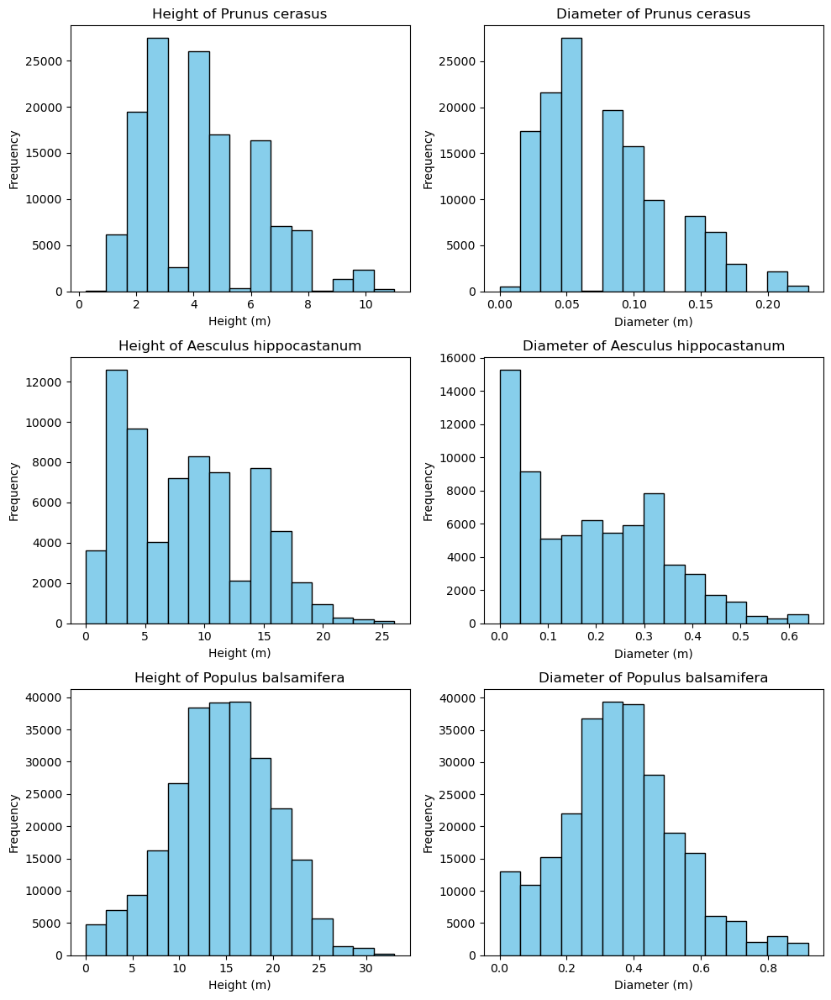

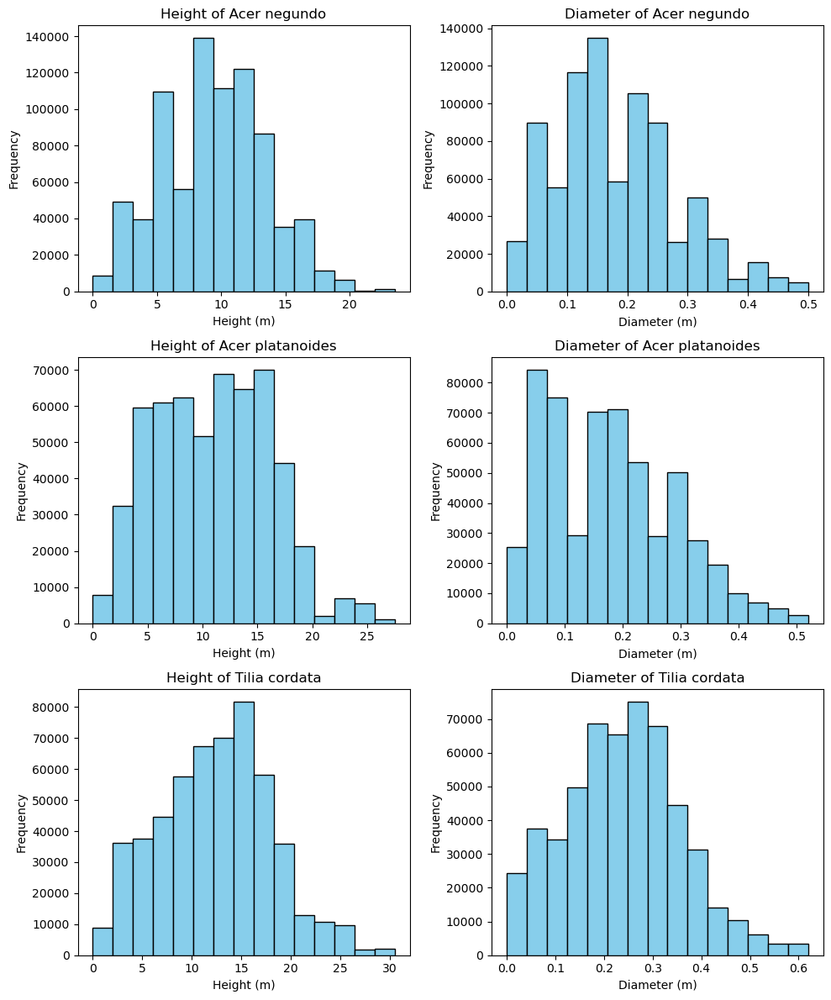

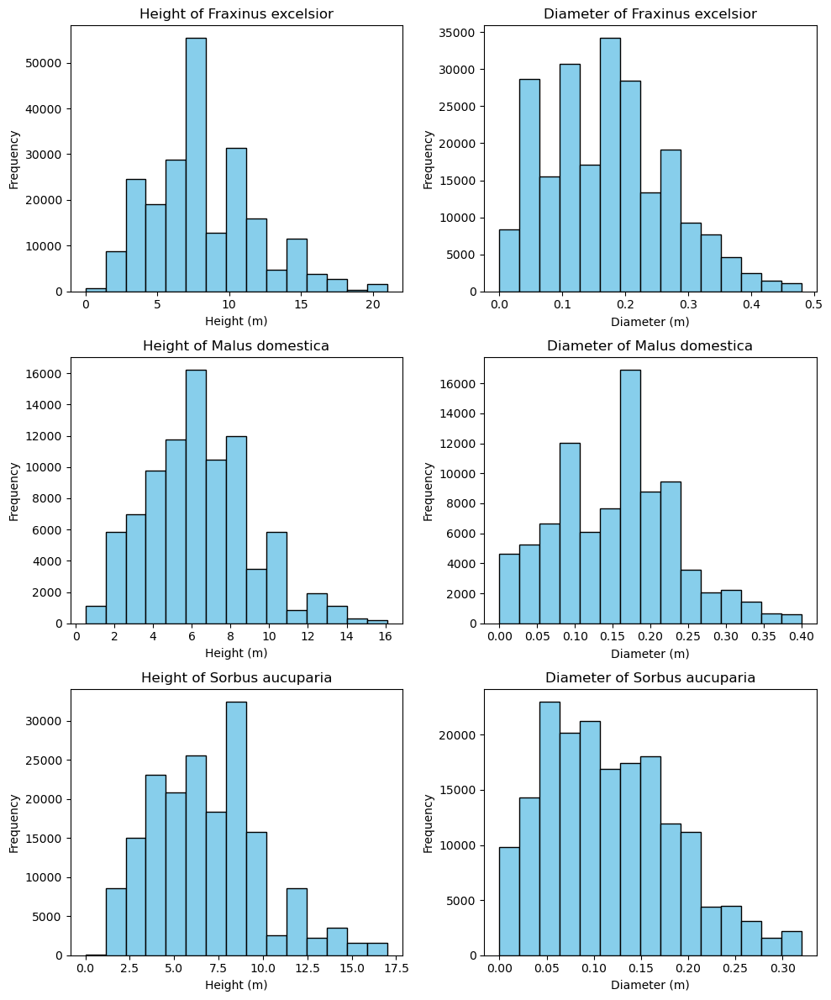

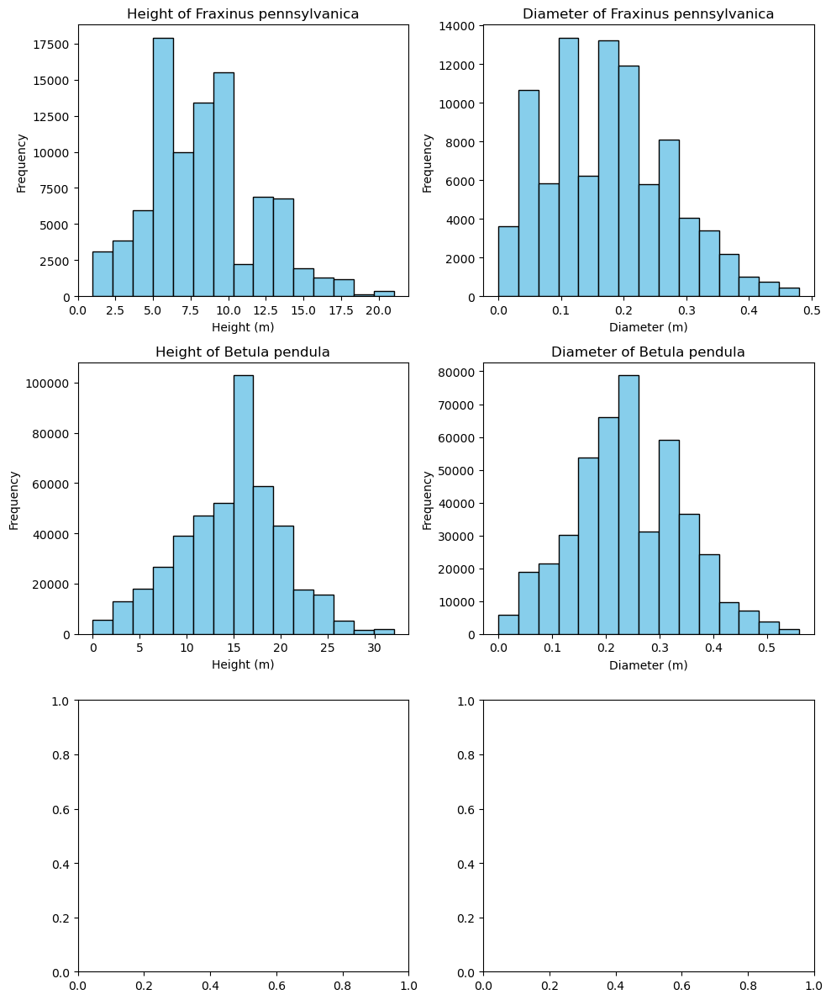

In [8]:
# First, you may want to drop rows where species_l is None
df = points_trees_clean.dropna(subset=['species_l'])

# Now we can plot the histograms
unique_species = df['species_l'].unique()

# Setting font to Times New Roman
plt.rcParams['font.family'] = 'Times New Roman'

# Define the number of species per figure
species_per_figure = 3

# Calculate the number of figures needed
num_figures = int(np.ceil(len(unique_species) / species_per_figure))

for j in range(num_figures):
    # Create a new figure for each group of species
    fig, ax = plt.subplots(nrows=species_per_figure, ncols=2, figsize=(10, 4*species_per_figure))
    
    for i in range(species_per_figure):
        # Calculate the index of the species in the unique_species list
        species_index = j*species_per_figure + i
        
        # Break the loop if we've plotted all species
        if species_index >= len(unique_species):
            break

        species = unique_species[species_index]
        df_species = df[df['species_l'] == species]

        # Calculating mean and standard deviation for height and diameter
        height_mean, height_std = df_species['height_m'].mean(), df_species['height_m'].std()
        diameter_mean, diameter_std = df_species['d_trunk_m'].mean(), df_species['d_trunk_m'].std()

        # Keeping only the values that fall within 2 standard deviations for height and diameter
        df_species = df_species[(np.abs(df_species['height_m'] - height_mean) <= 3*height_std) &
                                (np.abs(df_species['d_trunk_m'] - diameter_mean) <= 3*diameter_std)]

        # Height histogram
        ax[i, 0].hist(df_species['height_m'], bins=15, color='skyblue', edgecolor='black')
        ax[i, 0].set_title(f'Height of {species}')
        ax[i, 0].set_xlabel('Height (m)')
        ax[i, 0].set_ylabel('Frequency')

        # Diameter histogram
        ax[i, 1].hist(df_species['d_trunk_m'], bins=15, color='skyblue', edgecolor='black')
        ax[i, 1].set_title(f'Diameter of {species}')
        ax[i, 1].set_xlabel('Diameter (m)')
        ax[i, 1].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()


In [9]:
# Calculate the median height without grouping
median_height = points_filtered_ais['height_m'].median()

# Print the median height
print("Median height without grouping:", median_height)

Median height without grouping: 10.0


In [10]:
# Calculate the median height without grouping
median_height = points_filtered_ais['d_trunk_m'].median()

# Print the median height
print("Median height without grouping:", median_height)

Median height without grouping: 0.2


In [11]:
# Calculate the median diameter of tree trunks for each species
median_diameters = points_filtered_ais.groupby('species_l')['d_trunk_m'].median()

# Convert the result to a pandas DataFrame
result_diameters = pd.DataFrame({'species_l': median_diameters.index, 'median_d_trunk': median_diameters.values})

# Reorder the DataFrame based on the specified order
species_order = ['Acer negundo', 'Acer platanoides', 'Tilia cordata', 'Betula pendula', 'Populus balsamifera', 'Fraxinus excelsior', 'Sorbus aucuparia', 'Fraxinus pennsylvanica', 'Malus domestica', 'Aesculus hippocastanum']
result_diameters = result_diameters.set_index('species_l').loc[species_order].reset_index()

# Create a bar chart using Plotly
fig_diameters = px.bar(result_diameters, x='species_l', y='median_d_trunk', labels={'species_l': 'Species', 'median_d_trunk': 'Median Diameter (m)'}, title='Median Diameter of Tree Trunks for Each Species')
fig_diameters.update_layout(height=800, width=800, font=dict(size=18))

# Show the plot
fig_diameters.show()

В QGIS аггрегируем оставшиеся точки видов  

In [ ]:
# выбираем не пустые гексагоны
hex_non_empty_real = hexagon_data.loc[
    (hexagon_data['acer_plata'] > 0) | 
    (hexagon_data['acer_negun'] > 0) |
    (hexagon_data['aesculus_h'] > 0) |
    (hexagon_data['betula_p_1'] > 0) |
    (hexagon_data['fraxinus_e'] > 0) |
    (hexagon_data['fraxinus_p'] > 0) |
    (hexagon_data['malus_dome'] > 0) |
    (hexagon_data['populus_ba'] > 0) |
    (hexagon_data['sorbus_auc'] > 0) |
    (hexagon_data['tilia_cord'] > 0)
]
hex_non_empty_real.to_file('hex_non_empty_real.shp')

Считаем индекс Морана

In [5]:
hexagon_data = gpd.read_file('hexagons.shp')
# Create a spatial weights matrix
w = Queen.from_dataframe(hexagon_data)

/home/babykelp/anaconda3/lib/python3.9/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 5 disconnected components.
  warnings.warn(message)


In [6]:
attr = [
    'acer_negun', 
    'acer_plata', 
    'tilia_cord',  
    'betula_p_1', 
    'populus_ba', 
    'fraxinus_e', 
    'sorbus_auc', 
    'fraxinus_p', 
    'malus_dome', 
    'aesculus_h'
]

for i in attr:
   # Calculate Moran I Index
    moran = Moran(hexagon_data[i], w)

    # Print Moran I Index and p-value
    print(f"Moran's I of {i}: ", moran.I)
    print(f"p-value of {i}: ", moran.p_sim)

Moran's I of acer_negun:  0.6514871258378725
p-value of acer_negun:  0.001
Moran's I of acer_plata:  0.6183809675755726
p-value of acer_plata:  0.001
Moran's I of tilia_cord:  0.5798248559307824
p-value of tilia_cord:  0.001
Moran's I of betula_p_1:  0.5786478905297979
p-value of betula_p_1:  0.001
Moran's I of populus_ba:  0.5647236095885784
p-value of populus_ba:  0.001
Moran's I of fraxinus_e:  0.5287093602828834
p-value of fraxinus_e:  0.001
Moran's I of sorbus_auc:  0.6055434252276823
p-value of sorbus_auc:  0.001
Moran's I of fraxinus_p:  0.41775388796759805
p-value of fraxinus_p:  0.001
Moran's I of malus_dome:  0.34257983691382726
p-value of malus_dome:  0.001
Moran's I of aesculus_h:  0.4541687361757531
p-value of aesculus_h:  0.001


In [3]:
# Read hexagon data shapefile into a geodataframe
hex_non_empty_real = gpd.read_file('hex_non_empty_real.shp')
hex_non_empty_real.head()

,left,bottom,right,top,acer_plata,acer_sacch,betula_alb,picea_abie,picea_pung,pinus_silv,...,acer_negun,aesculus_h,betula_p_1,fraxinus_e,fraxinus_p,malus_dome,populus_ba,sorbus_auc,class_5,geometry
0,363250.000000,6.143298e+06,363583.333489,6.143587e+06,2.0,0.0,0.0,2.0,0.0,3.0,...,0.0,5.0,7.0,0.0,0.0,0.0,0.0,0.0,3,"POLYGON ((363250.000 6143442.741, 363333.333 6..."
1,363250.000000,6.144453e+06,363583.333489,6.144742e+06,0.0,0.0,0.0,2.0,0.0,0.0,...,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,3,"POLYGON ((363250.000 6144597.442, 363333.333 6..."
2,363500.000117,6.143443e+06,363833.333605,6.143731e+06,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0,3,"POLYGON ((363500.000 6143587.079, 363583.333 6..."
3,363500.000117,6.144597e+06,363833.333605,6.144886e+06,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,3,"POLYGON ((363500.000 6144741.780, 363583.333 6..."
4,363500.000117,6.144886e+06,363833.333605,6.145175e+06,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,3,"POLYGON ((363500.000 6145030.455, 363583.333 6..."


In [15]:
species_order = [
    'acer_negun', 
    'acer_plata', 
    'tilia_cord',  
    'betula_p_1', 
    'populus_ba', 
    'fraxinus_e', 
    'sorbus_auc', 
    'fraxinus_p', 
    'malus_dome', 
    'aesculus_h'
]

for i in range(len(hex_non_empty_real['class_5'].unique())):
    # Filter data by class zero
    class_zero_data = hex_non_empty_real[hex_non_empty_real['class_5'] == i]

    # Melt data to create long format for Plotly
    melted_data = pd.melt(class_zero_data, 
                          id_vars=['class_5'], 
                          value_vars=['acer_negun','acer_plata', 'aesculus_h','betula_p_1', 'fraxinus_e', 'fraxinus_p', 'malus_dome', 'populus_ba', 'sorbus_auc', 'tilia_cord'], 
                          var_name='species', 
                          value_name='value')
    # Change the order of melted_data using species_order
    melted_data['species'] = pd.Categorical(
        melted_data['species'], 
        categories=species_order, 
        ordered=True
    )

    melted_data = melted_data.sort_values(by='species')

    # Create box plot using Plotly
    fig = px.box(melted_data, x='species', y='value', color='species', 
                 title=f'Box Plot of Species by Class {i}')
    
     # Add line
    fig.add_trace(go.Scatter(
        x=species_order,
        y=melted_data.groupby('species')['value'].median(),
        mode='lines', 
        name='Median', 
        line=dict(color='red', width=3, dash='dot', shape='spline'))
    )

    fig.update_layout(height = 800, width = 800,font=dict(size=18))
    fig.update_yaxes(range=[0, 600])
    fig.show()

In [5]:
species_order = [
    'acer_negun', 
    'acer_plata', 
    'tilia_cord',  
    'betula_p_1', 
    'populus_ba', 
    'fraxinus_e', 
    'sorbus_auc', 
    'fraxinus_p', 
    'malus_dome', 
    'aesculus_h'
]

for i in range(len(hex_non_empty_real['class_5'].unique())):
    # Filter data by class zero
    class_zero_data = hex_non_empty_real[hex_non_empty_real['class_5'] == i]

    # Melt data to create long format for Plotly
    melted_data = pd.melt(class_zero_data, 
                          id_vars=['class_5'], 
                          value_vars=['acer_negun','acer_plata', 'aesculus_h','betula_p_1', 'fraxinus_e', 'fraxinus_p', 'malus_dome', 'populus_ba', 'sorbus_auc', 'tilia_cord'], 
                          var_name='species', 
                          value_name='value')
    # Change the order of melted_data using species_order
    melted_data['species'] = pd.Categorical(
        melted_data['species'], 
        categories=species_order, 
        ordered=True
    )

    melted_data = melted_data.sort_values(by='species')

    # Create box plot using Plotly
    fig = px.box(melted_data, x='species', y='value', color='species')
    
    # Add line
    fig.add_trace(go.Scatter(
        x=species_order,
        y=melted_data.groupby('species')['value'].median(),
        mode='lines', 
        name='Median', 
        line=dict(color='red', width=3, dash='dot', shape='spline'),
        showlegend=False)
    )

    fig.update_layout(height=800, width=800, font=dict(size=18), showlegend=False)
    fig.update_yaxes(range=[0, 600])
    fig.show()


<AxesSubplot:>

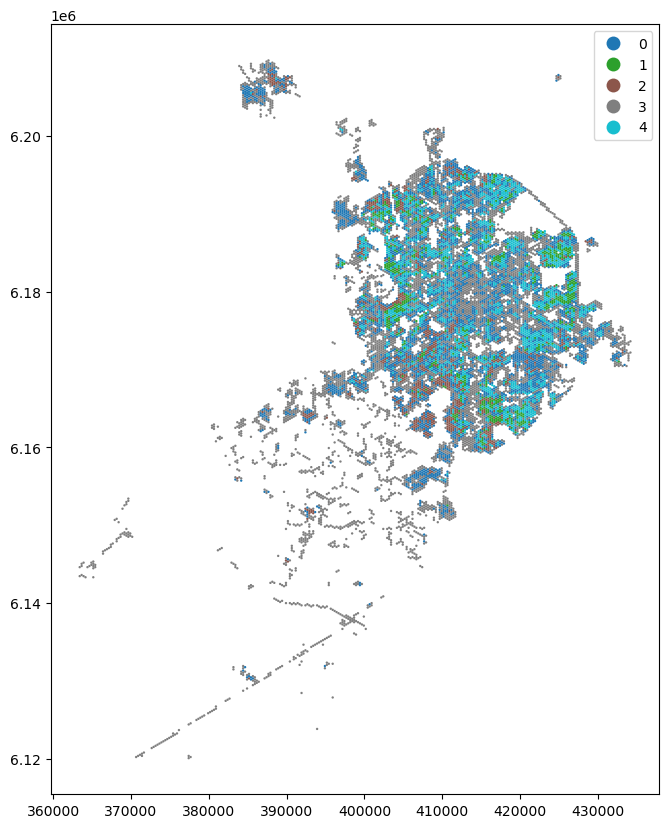

In [4]:
hex_non_empty_real.plot(column='class_5', figsize=(10, 10), legend = True, categorical=True)

# Выводы и идеи
#### 1) Посмотреть по ландшафтным контурам, правда ли тяготеют липы берёзы клёны к возвышенностям   
#####            *-- можно попробовать аггрегировать не по гегсагональной секте а по ландшафтным контурам.*
#### 2) сделать метод главных компонент, чтобы не анализировать все 10 видов, когда, кажется, нужно всего 4